## Philadelphia crime data analysis and modeling

Philadelphia has high crime rate among the cities in United States. In order to guide my real estate investment in Philadelphia, I would like to get more insight through data analysis of Philadelphia crime. I download recent 6 years data for analysis. 

Here, I utilize Koalas(pandas API on Apache Spark) and Spark SQL to display the data. Also, I use interactive plot to show the distribution of crime in the Philly.

In [0]:
!/databricks/python3/bin/python -m pip install --upgrade pip
!pip install folium

     |████████████████████████████████| 2.1 MB 5.2 MB/s 
  Attempting uninstall: pip
    Found existing installation: pip 21.0.1
    Uninstalling pip-21.0.1:
      Successfully uninstalled pip-21.0.1
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 95.0/95.0 KB 4.8 MB/s eta 0:00:00


In [0]:
from csv import reader
from pyspark.sql import Row 
import pyspark.sql.functions
from pyspark.sql.types import *
import pandas as pd
import numpy as np
import seaborn as sb
import matplotlib.pyplot as plt
import warnings
import databricks.koalas as ks
import datetime
import folium
from folium.plugins import MarkerCluster
import seaborn as sns

import os
os.environ["PYSPARK_PYTHON"] = "python3"


In [0]:
# download the data, comment out if the data are not available
import urllib.request

# urllib.request.urlretrieve("https://phl.carto.com/api/v2/sql?filename=incidents_part1_part2&format=csv&q=SELECT%20*%20,%20ST_Y(the_geom)%20AS%20lat,%20ST_X(the_geom)%20AS%20lng%20FROM%20incidents_part1_part2%20WHERE%20dispatch_date_time%20%3E=%20%272021-01-01%27%20AND%20dispatch_date_time%20%3C%20%272022-01-01%27", "/tmp/myxxxx.csv")
# dbutils.fs.mv("file:/tmp/myxxxx.csv", "dbfs:/laioffer/spark_hw1/data/phila_2021.csv")

# urllib.request.urlretrieve("https://phl.carto.com/api/v2/sql?filename=incidents_part1_part2&format=csv&q=SELECT%20*%20,%20ST_Y(the_geom)%20AS%20lat,%20ST_X(the_geom)%20AS%20lng%20FROM%20incidents_part1_part2%20WHERE%20dispatch_date_time%20%3E=%20%272020-01-01%27%20AND%20dispatch_date_time%20%3C%20%272021-01-01%27", "/tmp/myxxxx.csv")
# dbutils.fs.mv("file:/tmp/myxxxx.csv", "dbfs:/laioffer/spark_hw1/data/phila_2020.csv")

# urllib.request.urlretrieve("https://phl.carto.com/api/v2/sql?filename=incidents_part1_part2&format=csv&q=SELECT%20*%20,%20ST_Y(the_geom)%20AS%20lat,%20ST_X(the_geom)%20AS%20lng%20FROM%20incidents_part1_part2%20WHERE%20dispatch_date_time%20%3E=%20%272019-01-01%27%20AND%20dispatch_date_time%20%3C%20%272020-01-01%27", "/tmp/myxxxx.csv")
# dbutils.fs.mv("file:/tmp/myxxxx.csv", "dbfs:/laioffer/spark_hw1/data/phila_2019.csv")

# urllib.request.urlretrieve("https://phl.carto.com/api/v2/sql?filename=incidents_part1_part2&format=csv&q=SELECT%20*%20,%20ST_Y(the_geom)%20AS%20lat,%20ST_X(the_geom)%20AS%20lng%20FROM%20incidents_part1_part2%20WHERE%20dispatch_date_time%20%3E=%20%272018-01-01%27%20AND%20dispatch_date_time%20%3C%20%272019-01-01%27", "/tmp/myxxxx.csv")
# dbutils.fs.mv("file:/tmp/myxxxx.csv", "dbfs:/laioffer/spark_hw1/data/phila_2018.csv")

# urllib.request.urlretrieve("https://phl.carto.com/api/v2/sql?filename=incidents_part1_part2&format=csv&q=SELECT%20*%20,%20ST_Y(the_geom)%20AS%20lat,%20ST_X(the_geom)%20AS%20lng%20FROM%20incidents_part1_part2%20WHERE%20dispatch_date_time%20%3E=%20%272017-01-01%27%20AND%20dispatch_date_time%20%3C%20%272018-01-01%27", "/tmp/myxxxx.csv")
# dbutils.fs.mv("file:/tmp/myxxxx.csv", "dbfs:/laioffer/spark_hw1/data/phila_2017.csv")
# display(dbutils.fs.ls("dbfs:/laioffer/spark_hw1/data/"))

# urllib.request.urlretrieve("https://phl.carto.com/api/v2/sql?filename=incidents_part1_part2&format=csv&q=SELECT%20*%20,%20ST_Y(the_geom)%20AS%20lat,%20ST_X(the_geom)%20AS%20lng%20FROM%20incidents_part1_part2%20WHERE%20dispatch_date_time%20%3E=%20%272016-01-01%27%20AND%20dispatch_date_time%20%3C%20%272017-01-01%27", "/tmp/myxxxx.csv")
# dbutils.fs.mv("file:/tmp/myxxxx.csv", "dbfs:/laioffer/spark_hw1/data/phila_2016.csv")
# display(dbutils.fs.ls("dbfs:/laioffer/spark_hw1/data/"))

In [0]:
# use this file name later
data2021 = "dbfs:/laioffer/spark_hw1/data/phila_2021.csv"
data2020 = "dbfs:/laioffer/spark_hw1/data/phila_2020.csv"
data2019 = "dbfs:/laioffer/spark_hw1/data/phila_2019.csv"
data2018 = "dbfs:/laioffer/spark_hw1/data/phila_2018.csv"
data2017 = "dbfs:/laioffer/spark_hw1/data/phila_2017.csv"
data2016 = "dbfs:/laioffer/spark_hw1/data/phila_2016.csv"


In [0]:
df2021 = ks.read_csv(data2021)
df2020 = ks.read_csv(data2020)
df2019 = ks.read_csv(data2019)
df2018 = ks.read_csv(data2018)
df2017 = ks.read_csv(data2017)
df2016 = ks.read_csv(data2016)
print(df2021.shape)
frames = [df2021, df2020, df2019, df2018, df2017, df2016]
df = ks.concat(frames)
print(df.shape)
print(df.head())

df.to_csv("dbfs:/laioffer/spark_hw1/data/csv")

(137219, 18)
(906712, 18)
                                             the_geom  cartodb_id                                the_geom_webmercator  objectid  dc_dist psa   dispatch_date_time dispatch_date dispatch_time  hour_        dc_key                    location_block  ucr_general            text_general_code    point_x    point_y        lat        lng
0  0101000020E6100000ECBC5322C5CE52C03D31678D2CF14340     2640566  0101000020110F00003952D0165FF25FC17988322F797F5241   5084575       12   1  2021-03-19 10:41:04    2021-03-19      10:41:04     10  202112018994              4500 BLOCK ISLAND AV          600                       Thefts -75.230782  39.884172  39.884172 -75.230782
1  0101000020E61000007A37B3E9CAC652C05C69211AC0034440     2640573  0101000020110F00003952C02BD2E45FC128F33D3F0E945241   4627971       15   1  2021-02-25 16:44:00    2021-02-25      16:44:00     16  202115013539  E ROOSEVELT BLVD  /  WHITAKER AV          700          Motor Vehicle Theft -75.106135  40.029300  40

In [0]:
# clean and add some time features 
df = df.rename(columns={'hour_': 'hour'})
#df['dispatch_date'] = ks.to_datetime(df['dispatch_date'])
df['day_of_week'] = (ks.to_datetime(df['dispatch_date'])).dt.day_name()
df['month'] = ks.DatetimeIndex(ks.to_datetime(df['dispatch_date'])).month
df['year'] = ks.DatetimeIndex(ks.to_datetime(df['dispatch_date'])).year
# The attitude and lagitude beyond certain area are not Philly area
df = df.loc[(df['lat']>38) & (df['lng']>-76)]
          
df.head()

/databricks/spark/python/pyspark/sql/pandas/functions.py:386: UserWarning: In Python 3.6+ and Spark 3.0+, it is preferred to specify type hints for pandas UDF instead of specifying pandas UDF type which will be deprecated in the future releases. See SPARK-28264 for more details.
  warnings.warn(


,the_geom,cartodb_id,the_geom_webmercator,objectid,dc_dist,psa,dispatch_date_time,dispatch_date,dispatch_time,hour,dc_key,location_block,ucr_general,text_general_code,point_x,point_y,lat,lng,day_of_week,month,year
0,0101000020E6100000ECBC5322C5CE52C03D31678D2CF1...,2640566,0101000020110F00003952D0165FF25FC17988322F797F...,5084575,12,1,2021-03-19 10:41:04,2021-03-19,10:41:04,10,202112018994,4500 BLOCK ISLAND AV,600,Thefts,-75.230782,39.884172,39.884172,-75.230782,Friday,3,2021
1,0101000020E61000007A37B3E9CAC652C05C69211AC003...,2640573,0101000020110F00003952C02BD2E45FC128F33D3F0E94...,4627971,15,1,2021-02-25 16:44:00,2021-02-25,16:44:00,16,202115013539,E ROOSEVELT BLVD / WHITAKER AV,700,Motor Vehicle Theft,-75.106135,40.029300,40.029300,-75.106135,Thursday,2,2021
2,0101000020E6100000C9F4955136C752C0DCD4A31DF5FE...,2640955,0101000020110F000060AD479C88E55FC1780A94B2BD8E...,5221029,24,2,2021-03-25 22:33:54,2021-03-25,22:33:54,22,202124019454,3100 BLOCK FRANKFORD AV,1500,Weapon Violations,-75.112690,39.991855,39.991855,-75.112690,Thursday,3,2021
3,0101000020E6100000684F76F106C952C0CA7097587406...,2640957,0101000020110F00004A556CD29DE85FC12E37B02C0E97...,3500576,35,1,2021-01-02 18:57:00,2021-01-02,18:57:00,18,202135000451,N PARK AV / CHELTEN AV,700,Motor Vehicle Theft,-75.141049,40.050426,40.050426,-75.141049,Saturday,1,2021
4,0101000020E6100000A21CD49748CF52C0223A3E398EFB...,2641121,0101000020110F00003528AC623EF35FC163C50F75F88A...,4993349,19,2,2021-03-16 00:07:48,2021-03-16,00:07:48,0,202119014625,5900 BLOCK SPRING ST,1400,Vandalism/Criminal Mischief,NaN,NaN,39.965278,-75.238806,Tuesday,3,2021


In [0]:
print("Data dimensions: ")
print(df.shape)

Data dimensions: 
(901477, 21)


In [0]:
print("Column values:")
print(df.columns.values)

Column values:
['the_geom' 'cartodb_id' 'the_geom_webmercator' 'objectid' 'dc_dist' 'psa'
 'dispatch_date_time' 'dispatch_date' 'dispatch_time' 'hour' 'dc_key'
 'location_block' 'ucr_general' 'text_general_code' 'point_x' 'point_y'
 'lat' 'lng' 'day_of_week' 'month' 'year']


In [0]:
print(df.dtypes)

the_geom                 object
cartodb_id                int32
the_geom_webmercator     object
objectid                  int32
dc_dist                   int32
psa                      object
dispatch_date_time       object
dispatch_date            object
dispatch_time            object
hour                      int32
dc_key                    int64
location_block           object
ucr_general               int32
text_general_code        object
point_x                 float64
point_y                 float64
lat                     float64
lng                     float64
day_of_week                 <U0
month                     int64
year                      int64
dtype: object


In [0]:
print(df.describe())

         cartodb_id      objectid        dc_dist           hour        dc_key    ucr_general       point_x        point_y            lat            lng          month           year
count  9.014770e+05  9.014770e+05  901477.000000  901473.000000  9.014770e+05  901477.000000  9.003480e+05  900348.000000  901477.000000  901477.000000  901477.000000  901477.000000
mean   1.637884e+06  2.375628e+06      17.679113      13.432176  2.018580e+11    1167.061389  5.939933e+01      52.453303      39.992276     -75.152721       6.574686    2018.402793
std    9.044570e+05  2.516135e+06      10.284042       6.082610  1.693986e+08     756.255192  1.903200e+04    1765.208914       0.044011       0.058661       3.370621       1.690051
min    1.100000e+01  5.000000e+00       1.000000       0.000000  2.006350e+11     100.000000 -7.527898e+01      39.875032      39.875032     -75.278982       1.000000    2016.000000
25%    8.410440e+05  8.406150e+05       9.000000      10.000000  2.017151e+11     600.0000

In [0]:
#print(df.loc[(df['year']==2019) & (df['month']==2) & (df['lat']>38) & (df['lng']>-76)].describe())

In [0]:
print(df.info())

<class 'databricks.koalas.frame.DataFrame'>
Int64Index: 901477 entries, 0 to 159605
Data columns (total 21 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   the_geom              901477 non-null  object 
 1   cartodb_id            901477 non-null  int32  
 2   the_geom_webmercator  901477 non-null  object 
 3   objectid              901477 non-null  int32  
 4   dc_dist               901477 non-null  int32  
 5   psa                   901315 non-null  object 
 6   dispatch_date_time    901477 non-null  object 
 7   dispatch_date         901477 non-null  object 
 8   dispatch_time         901477 non-null  object 
 9   hour                  901473 non-null  int32  
 10  dc_key                901477 non-null  int64  
 11  location_block        901470 non-null  object 
 12  ucr_general           901477 non-null  int32  
 13  text_general_code     901477 non-null  object 
 14  point_x               900348 non-null  float64

In [0]:
# Look at some distinct data
dc_dist_distinct = df.groupby('dc_dist')['dc_dist'].count()
print(dc_dist_distinct)
print("\n")



dc_dist
26    34776
12    49210
22    63192
1     15406
6     41668
16    33116
3     39183
5     12964
19    64380
15    68023
17    23957
9     39354
35    55883
8     26290
39    50261
7     16455
77     1503
25    54939
24    69854
14    51153
2     42004
18    47905
4         1
Name: dc_dist, dtype: int64




In [0]:
ucr_text_distinct = df.groupby(['ucr_general', 'text_general_code']).size()
print(ucr_text_distinct)

ucr_general  text_general_code                      
2000         Offenses Against Family and Children         1575
1700         Other Sex Offenses (Not Commercialized)      5275
800          Other Assaults                             140272
400          Aggravated Assault No Firearm               32004
600          Theft from Vehicle                          79168
100          Homicide - Criminal                          1841
600          Thefts                                     136130
300          Robbery No Firearm                          18403
1600         Prostitution and Commercialized Vice         3660
300          Robbery Firearm                             13794
700          Motor Vehicle Theft                         20807
500          Burglary Non-Residential                    10268
1300         Receiving Stolen Property                     853
1800         Narcotic / Drug Law Violations              47459
2200         Liquor Law Violations                         642
23

In [0]:
import warnings
warnings.filterwarnings("ignore", 'This pattern has match groups')

# Check dates and times for consistent formatting
def does_column_match_pattern(data_frame, column_name, pattern):
    ''' Returns true if every value of a data frame column matches a pattern
        data_frame = the pandas data frame to be checked
        column_name = name of column to be checked
        pattern = regular expression to be matched
    '''
    data = data_frame[column_name]
    return data.str.contains(pattern).all()

# Patterns copied from http://regexlib.com/DisplayPatterns.aspx?cattabindex=4&categoryId=5&AspxAutoDetectCookieSupport=1
date_time_re = '20\d{2}-((0[1-9])|(1[0-2]))-((0[1-9])|([1-2][0-9])|(3[0-1]))(\s)(([0-1][0-9])|(2[0-3])):([0-5][0-9]):([0-5][0-9])'
date_re = '20\d{2}-((0[1-9])|(1[0-2]))-((0[1-9])|([1-2][0-9])|(3[0-1]))'
time_re = '^(([0-1]?[0-9])|([2][0-3])):([0-5]?[0-9])(:([0-5]?[0-9]))?$'
print("Do all elements in columns match expected pattern?")
#print("Dispatch_Date_Time: ", does_column_match_pattern(df, 'dispatch_date_time', date_time_re))
#print("Dispatch_Date: ", does_column_match_pattern(df, 'dispatch_date', date_re))
#print("Dispatch_Time: ", does_column_match_pattern(df, 'dispatch_time', time_re))

Do all elements in columns match expected pattern?


In [0]:
# Exclude rows without a crime type or description
df.dropna(subset=['ucr_general', 'text_general_code'], inplace = True)

# How large is data set now?
print("Data dimensions: ")
print(df.shape)

Data dimensions: 
(901477, 21)


In [0]:
# Check before merger
print("Before district merger:")
dc_dist_distinct = df.groupby('dc_dist')['dc_dist'].count()
print(dc_dist_distinct)                             
print("\n")

# Merge districts
df.loc[df.dc_dist == 4, 'dc_dist'] = 3
df.loc[df.dc_dist == 23, 'dc_dist'] = 22
df.loc[df.dc_dist == 77, 'dc_dist'] = 12
df.loc[df.dc_dist == 92, 'dc_dist'] = 14

# Check the result of the merger
print("After district merger:")
dc_dist_distinct = df.groupby('dc_dist')['dc_dist'].count()
print(dc_dist_distinct)
print("\n")

Before district merger:
dc_dist
26    34776
12    49210
22    63192
1     15406
6     41668
16    33116
3     39183
5     12964
19    64380
15    68023
17    23957
9     39354
35    55883
8     26290
39    50261
7     16455
77     1503
25    54939
24    69854
14    51153
2     42004
18    47905
4         1
Name: dc_dist, dtype: int64


After district merger:
dc_dist
26    34776
12    50713
22    63192
1     15406
6     41668
16    33116
3     39184
5     12964
19    64380
15    68023
17    23957
9     39354
35    55883
8     26290
39    50261
7     16455
25    54939
24    69854
14    51153
2     42004
18    47905
Name: dc_dist, dtype: int64




In [0]:
# Try groupby to remove duplicates
df = df.drop_duplicates(['dispatch_date_time', 'location_block', 'ucr_general', 'text_general_code'])

# How large is data set now?
print("Data dimensions: ")
print(df.shape)

Data dimensions: 
(880630, 21)


In [0]:
df.to_spark().createOrReplaceTempView("philly_crime")

In [0]:
# What parts of the city have the most crime?

In [0]:
#Spark DataFrame based
#df_dc_dist = df.groupBy('dc_dist').count().orderBy('count', ascending=False)
df_dc_dist = df.groupby('dc_dist').size().reset_index(name='counts').sort_values('counts',ascending=False)
display(df_dc_dist)

dc_dist,counts
24,67559
15,66434
19,62341
22,62048
35,54872
25,53651
14,50578
39,49428
12,49367
18,46425


In [0]:
#Spark SQL based
sql_dc_dist = spark.sql("""
  SELECT dc_dist, COUNT(*) AS Count 
  FROM philly_crime 
  GROUP BY dc_dist
  ORDER BY Count DESC
""")
display(sql_dc_dist)

dc_dist,Count
24,67559
15,66434
19,62341
22,62048
35,54872
25,53651
14,50578
39,49428
12,49367
18,46425


We can see that district 24 has the highest crime amount in the city. It is located in the North Philadelphia area.

In [0]:
# Which crimes are most frequently committed?

In [0]:
#Spark DataFrame based
df_category = df.groupby('text_general_code').size().reset_index(name='counts').sort_values('counts',ascending=False).head(10)
display(df_category)

text_general_code,counts
Other Assaults,139288
Thefts,135787
All Other Offenses,126714
Vandalism/Criminal Mischief,87875
Theft from Vehicle,79113
Fraud,62117
Narcotic / Drug Law Violations,46753
Aggravated Assault No Firearm,31699
Burglary Residential,27874
Motor Vehicle Theft,20770


In [0]:
#Spark SQL based
sql_category = spark.sql("""
  SELECT text_general_code, COUNT(*) AS Count 
  FROM philly_crime 
  GROUP BY text_general_code
  ORDER BY Count DESC
""")
display(sql_category)

text_general_code,Count
Other Assaults,139288
Thefts,135787
All Other Offenses,126714
Vandalism/Criminal Mischief,87875
Theft from Vehicle,79113
Fraud,62117
Narcotic / Drug Law Violations,46753
Aggravated Assault No Firearm,31699
Burglary Residential,27874
Motor Vehicle Theft,20770


According to the number of crimes, we can classify crime category into three groups based on the above-mentioned graphs and tables: high crime rate, medium crime rate, and low crime rate.

In [0]:
# How has crime changed over time?

In [0]:
#Spark DataFrame based
df_yr = df.groupby('year').size().reset_index(name='counts').sort_values('year')
display(df_yr)

year,counts
2016,154168
2017,152162
2018,149071
2019,155452
2020,135648
2021,134129


In [0]:
#Spark SQL based
sql_yr = spark.sql("""
  SELECT year, COUNT(*) AS Count 
  FROM philly_crime 
  GROUP BY year
  ORDER BY year
""")
display(sql_yr)

year,Count
2016,154168
2017,152162
2018,149071
2019,155452
2020,135648
2021,134129


The crime rates among these years are pretty stable. In 2020 and 2021， the amount of crime decrease a little bit, the possible cause may be COVID19. Let's see it later.

In [0]:
# What times of year do we see the most crimes committed?

In [0]:
#Spark DataFrame based
df_month = df.groupby('month').size().reset_index(name='counts').sort_values('month')
display(df_month)

month,counts
1,69829
2,64555
3,69363
4,71028
5,78410
6,76860
7,76801
8,78591
9,76950
10,80497


In [0]:
#Spark SQL based
sql_month = spark.sql("""
  SELECT month, COUNT(*) AS Count 
  FROM philly_crime 
  GROUP BY month
  ORDER BY month
""")
display(sql_month)

month,Count
1,69829
2,64555
3,69363
4,71028
5,78410
6,76860
7,76801
8,78591
9,76950
10,80497


From May to October, the crime amount are higher than other months. It may caused by more activities and social events in late spring along to autumn.

In [0]:
# Which season of year do we see the most crimes committed?

In [0]:
# df['Season'] = 'Unknown'
# df.loc[df['Month'].between(0, 30, inclusive=False), 'difficulty'] = 'Easy'
# df.loc[df['Month'].between(30, 60, inclusive=True), 'difficulty'] = 'Medium'

df['season'] = np.nan
df.loc[df.month.isin([1,2,3]), 'season'] = '1_spring'
df.loc[df.month.isin([4,5,6]), 'season'] = '2_summer' 
df.loc[df.month.isin([7,8,9]), 'season'] = '3_autumn' 
df.loc[df.month.isin([10,11,12]), 'season'] = '4_winter' 

df_season = df.groupby('season').size().reset_index(name='counts').sort_values('season')
display(df_season)

season,counts
1_spring,203747
2_summer,226298
3_autumn,232342
4_winter,218243


In [0]:
#Spark SQL based
sql_season = spark.sql("""
  select count(*) as Count, 
    case when Month in (1,2,3) then '1_spring'
         when Month in (4,5,6) then '2_summer'
         when Month in (7,8,9) then '3_autumn'
         else '4_winter'
     end as Season
  from philly_crime
  group by Season
  order by Season
""")

display(sql_season)

Count,Season
203747,1_spring
226298,2_summer
232342,3_autumn
218243,4_winter


In [0]:
# What times of day do we see the most crimes committed?

In [0]:
#Spark DataFrame based
df_hr = df.groupby('hour').size().reset_index(name='counts').sort_values('hour')
display(df_hr)

hour,counts
0,29574
1,23843
2,18339
3,13886
4,10113
5,8575
6,8038
7,17164
8,34327
9,44192


In [0]:
#Spark SQL based
sql_hr = spark.sql("""
  SELECT hour, COUNT(*) AS Count 
  FROM philly_crime 
  GROUP BY hour
  ORDER BY hour
""")
display(sql_hr)

hour,Count
null,4
0,29574
1,23843
2,18339
3,13886
4,10113
5,8575
6,8038
7,17164
8,34327


The most crimes committed in 10am-12pm, 4pm-6pm and the least crimes in 4am-6am. The police department should arrange more patrol in 10am-12pm, 4pm-6pm.

In [0]:
## Look at most frequent streets and intersections - where are these located in the city?

In [0]:
#Spark DataFrame based
df_block = df.groupby('location_block').size().reset_index(name='counts').sort_values('counts',ascending=False)
display(df_block)

In [0]:
#Spark SQL based
sql_block = spark.sql("""
  SELECT location_block, COUNT(*) AS Count 
  FROM philly_crime 
  GROUP BY location_block
  ORDER BY Count DESC
""")
display(sql_block)

Most of top crime locations are in North Philly, Center Philly and Northeast Philly. Also, these locations are close to shopping center and bus stop. For police department, shopping center and bus stop need to get more attention.

In [0]:
#Analysis the number of crime in each month of 2016, 2017, 2018, 2019. 

In [0]:
#Spark SQL based
sql_year_month = spark.sql("""
  SELECT year, month, count(*) as Count
  FROM philly_crime
  WHERE year in (2016,2017,2018,2019)
  GROUP BY year, month
  ORDER BY year, month
""")

display(sql_year_month)

year,month,Count
2016,1,11002
2016,2,11236
2016,3,12843
2016,4,12992
2016,5,14027
2016,6,13954
2016,7,12882
2016,8,14273
2016,9,13136
2016,10,13835


In [0]:
#Spark DataFrame based
df_year_month = df.loc[df['year'].isin([2016,2017,2018,2019])].groupby(['year', 'month']).size().reset_index(name='counts').sort_values(['year', 'month'])
display(df_year_month)

year,month,counts
2016,1,11002
2016,2,11236
2016,3,12843
2016,4,12992
2016,5,14027
2016,6,13954
2016,7,12882
2016,8,14273
2016,9,13136
2016,10,13835


There are not significant crime amount differece among these years. I don't inclule 2020 and 2021 because the impart of COVID19. This impact will be analysed in later analysis.

In [0]:
# Crime types by police district

# (1) Step1: Find out the top-3 danger disrict  
# (2) Step2: find out the crime event category and time (hour) from the result of step 1  

In [0]:
#Spark SQL based

sql_top3_dist = spark.sql("""
  with top3 as(
    select dc_dist, count(*) as Count
    from philly_crime
    group by dc_dist
    order by Count DESC
    limit 3)
  select text_general_code, count(*) as Count
  from top3 left join philly_crime on top3.dc_dist = philly_crime.dc_dist
  group by text_general_code
  order by Count DESC
  limit 7
""")

display(sql_top3_dist)

text_general_code,Count
All Other Offenses,34351
Other Assaults,30566
Thefts,23288
Narcotic / Drug Law Violations,18353
Vandalism/Criminal Mischief,18211
Theft from Vehicle,13831
Fraud,12208


In [0]:
#Spark DataFrame based
top3_dist = df.groupby('dc_dist').size().reset_index(name='counts').sort_values('counts',ascending=False).head(3)['dc_dist'].tolist()
df_top3_dist = df.loc[df['dc_dist'].isin(top3_dist)].groupby(['text_general_code', 'hour']).size().reset_index(name='counts').sort_values('hour')
display(df_top3_dist)
# df_year_month = df.loc[df['year'].isin([2016,2017,2018,2019])].groupby(['year', 'month']).size().reset_index(name='counts').sort_values(['year', 'month'])
# display(df_year_month)

text_general_code,hour,counts
Robbery Firearm,0,201
Vandalism/Criminal Mischief,0,711
All Other Offenses,0,1620
Other Sex Offenses (Not Commercialized),0,25
Theft from Vehicle,0,229
DRIVING UNDER THE INFLUENCE,0,293
Receiving Stolen Property,0,7
Fraud,0,107
Other Assaults,0,927
Embezzlement,0,4


In top 3 danger districts(15 19 24), the crime hour distribution is similar to the city crime hour distribution. And top crime in three districts are: thefts, drug, vandalism.

In [0]:
#Count the number of crimes each Sunday at Philly downtown
# Philly center downtown police district area: 6, 9, 22

In [0]:
#Spark DataFrame based
df_downtown_sunday = df.loc[(df['dc_dist'].isin([6,9,22])) & (df['day_of_week'] == 'Sunday')].groupby(['dispatch_date']).size().reset_index(name='counts').sort_values('dispatch_date')
display(df_downtown_sunday)

dispatch_date,counts
2016-01-03,59
2016-01-10,61
2016-01-17,48
2016-01-24,13
2016-01-31,65
2016-02-07,56
2016-02-14,34
2016-02-21,65
2016-02-28,54
2016-03-06,50


In [0]:
#Spark SQL based

sql_downtown_sunday = spark.sql("""
  
  select dispatch_date, count(*) as Count
  from philly_crime
  WHERE dc_dist in (6,9,22) and day_of_week = 'Sunday'
  group by dispatch_date
  order by dispatch_date

""")

display(sql_downtown_sunday)

dispatch_date,Count
2016-01-03,59
2016-01-10,61
2016-01-17,48
2016-01-24,13
2016-01-31,65
2016-02-07,56
2016-02-14,34
2016-02-21,65
2016-02-28,54
2016-03-06,50


From 2016 to 2021, the crime amount on Sunday are pretty stable, except May/31/2020， Huge amount of protesters cause some violence in the city.

In [0]:
#Analysis the number of crime with respsect to the hour in certian day like 2016/12/15, 2017/12/15, 2018/12/15, 2019/12/15. Then, give travel suggestion to visit Philly.

In [0]:
#Spark DataFrame based
certain_days = ['2016-12-15','2017-12-15','2018-12-15','2019-12-15']
df_certain_days = df.loc[df['dispatch_date'].isin(certain_days)].groupby(['dispatch_date']).size().reset_index(name='counts').sort_values(['dispatch_date'])
display(df_certain_days)

dispatch_date,counts
2016-12-15,399
2017-12-15,304
2018-12-15,347
2019-12-15,355


In [0]:
#Spark SQL based
sql_certain_days = spark.sql("""
  select dispatch_date, count(*) as Count
  from philly_crime
  where dispatch_date like '%-12-15' and year in (2016,2017,2018,2019)
  group by dispatch_date
  order by dispatch_date
""")

display(sql_certain_days)

dispatch_date,Count
2016-12-15,399
2017-12-15,304
2018-12-15,347
2019-12-15,355


#Clustering
I apply Spark ML custering algorithm to cluster the spatial data, then visualize the clustering results.

In [0]:
#refer: https://spark.apache.org/docs/latest/ml-clustering.html

from pyspark.ml.clustering import KMeans
from pyspark.ml.evaluation import ClusteringEvaluator
from pyspark.ml.feature import VectorAssembler
# Loads data.
df_clustering = df.loc[(df['year']==2019) & (df['month']==1) ][['objectid','point_x','point_y']].dropna(axis = 0).to_spark()
#Prepare features
FEATURES_COL = ['point_x', 'point_y']
for col in df_clustering.columns:
    if col in FEATURES_COL:
        df_clustering = df_clustering.withColumn(col,df_clustering[col].cast('float'))
vecAssembler = VectorAssembler(inputCols=FEATURES_COL, outputCol='features')
df_kmeans = vecAssembler.transform(df_clustering).select('objectid', 'features')

#display(df_clustering)


In [0]:
#Optimize choice of k
cost = np.zeros(20)
for k in range(2,20):
    kmeans = KMeans().setK(k).setSeed(1).setFeaturesCol("features")
    model = kmeans.fit(df_kmeans)
    predictions = model.transform(df_kmeans)
    evaluator = ClusteringEvaluator()
    cost[k] = evaluator.evaluate(predictions)

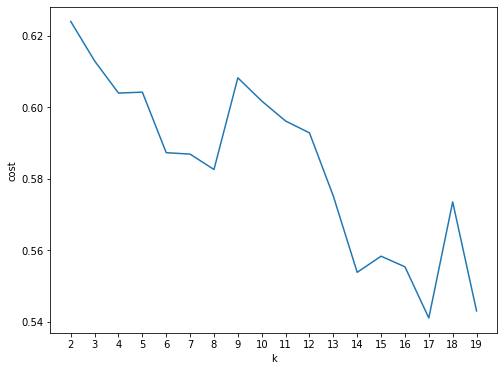

In [0]:
fig, ax = plt.subplots(1,1, figsize =(8,6))
ax.plot(range(2,20),cost[2:20])
ax.set_xlabel('k')
ax.set_xticks(np.arange(2,20,1))
ax.set_ylabel('cost')
display()

k = 17 is a pretty fair clustering number.

In [0]:
# X = df[['lat','lng']]
# X = X.dropna(axis = 0, subset = ['lat'] )

In [0]:
# kmeans = KMeans().setK(5).setSeed(1).setFeaturesCol("features")
# model = kmeans.fit(df_kmeans)
# clust_labels = model.predict(df_kmeans)
# cent = model.cluster_centers_
# kmeans1 = pd.DataFrame(clust_labels)
# df_kmeans.insert((df_kmeans.shape[1]),'kmeans',kmeans1)
# df_kmeans

kmeans = KMeans().setK(17).setFeaturesCol("features")
model = kmeans.fit(df_kmeans)
prediction = model.transform(df_kmeans).select('prediction').collect()
labels = [p.prediction for p in prediction ]


In [0]:
df_show = df_clustering.toPandas()
df_show.insert((df_show.shape[1]),'labels',labels)
df_show.head()

,objectid,point_x,point_y,labels
0,2552856,-75.118431,39.997448,11
1,1612578,-75.234436,39.923565,15
2,2135050,-75.168739,39.995850,1
3,239983,-75.167320,39.986130,1
4,1530006,-75.173134,39.934639,5


In [0]:
# u_labels = np.unique(labels)
# for i in u_labels:
#     plt.scatter(df_show.loc[labels == i , 'point_x'] , df_show.loc[labels == i , 'point_y'] , label = i)
# plt.legend()
# plt.show()

Out[60]: <AxesSubplot:title={'center':'K-Means Clustering'}, xlabel='Long', ylabel='Lat'>

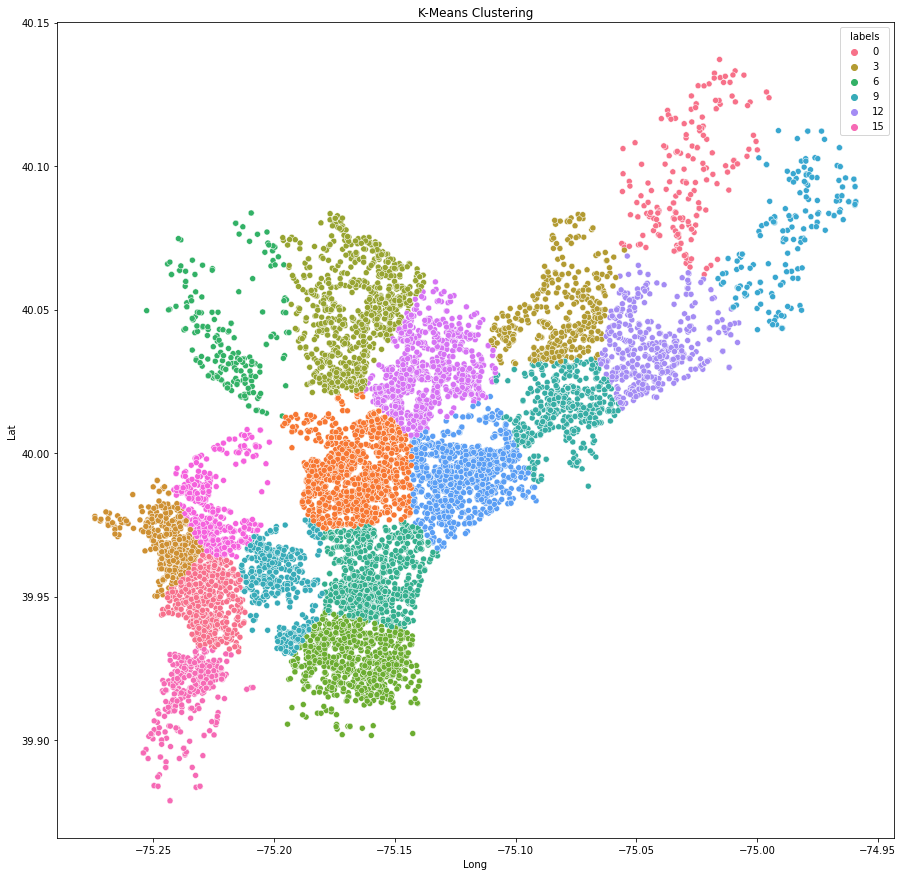

In [0]:
fig = plt.figure(figsize=(15,15))
ax = fig.add_subplot(111)
# LABEL_COLOR_MAP = {0 : '#fc3030', 1 : '#f8fc30',2 : '#70fc30',3 : '#30fc92', 4 : '#30fce7',5: '#30cffc',6: '#3088fc',7:'#8b30fc',8:'#f530fc',9:'#fc30ad',10:'#fc306d'}
# labels=df_show['labels']
# label_color = [LABEL_COLOR_MAP[l] for l in labels]
ax.set_title('K-Means Clustering')
ax.set_xlabel('Long')
ax.set_ylabel('Lat')
#plt.scatter(df_show['point_x'],df_show['point_y'], c=label_color)
sns.scatterplot(data=df_show, x='point_x', y='point_y', hue='labels',palette='husl')


Here, the clustering can be used for police patrol area division.

In [0]:
# Analyze the relationship between infection of Covid19 and Count of Crime in Philly 2021

In [0]:
#covid19 data
# urllib.request.urlretrieve("https://data.pa.gov/api/views/j72v-r42c/rows.csv?accessType=DOWNLOAD", "/tmp/mycvoid.csv")
# dbutils.fs.mv("file:/tmp/mycvoid.csv", "dbfs:/FileStore/tables/covid19.csv")

covid_data_path = "dbfs:/FileStore/tables/covid19.csv"
df_covid = ks.read_csv(covid_data_path)
df_covid = df_covid.loc[df_covid['Jurisdiction'] == 'Philadelphia']
#display(df_covid)

In [0]:
df_covid['Date'] = ks.to_datetime(df_covid['Date'])
df_covid['year'] = ks.DatetimeIndex(df_covid['Date']).year
df_covid_1 = df_covid.loc[df_covid['year'].isin([2020,2021])].sort_values('Date')
df_covid_1.columns = df_covid_1.columns.str.strip()
df_covid_1.columns = [col.replace(" ", "_") for col in df_covid_1.columns]
#df_covid_1.columns = df_covid_1.columns.replace(' ','_')
display(df_covid_1)

/databricks/spark/python/pyspark/sql/pandas/functions.py:386: UserWarning: In Python 3.6+ and Spark 3.0+, it is preferred to specify type hints for pandas UDF instead of specifying pandas UDF type which will be deprecated in the future releases. See SPARK-28264 for more details.
  warnings.warn(


Jurisdiction,Date,New_Cases,7-day_Average_New_Cases,Cumulative_cases,Population_(2019),New_Case_Rate,7-Day_Average_New_Case_Rate,Cumulative_Case_Rate,County_FIPS_Code,Longitude,Latitude,Georeferenced_Lat_&_Long,year
Philadelphia,2020-03-01T00:00:00.000+0000,0,null,0,1584064,0.0,null,0.0,42101,-75.140236,40.00444354,POINT (-75.140236 40.00444354),2020
Philadelphia,2020-03-02T00:00:00.000+0000,0,null,0,1584064,0.0,null,0.0,42101,-75.140236,40.00444354,POINT (-75.140236 40.00444354),2020
Philadelphia,2020-03-03T00:00:00.000+0000,0,null,0,1584064,0.0,null,0.0,42101,-75.140236,40.00444354,POINT (-75.140236 40.00444354),2020
Philadelphia,2020-03-04T00:00:00.000+0000,0,null,0,1584064,0.0,null,0.0,42101,-75.140236,40.00444354,POINT (-75.140236 40.00444354),2020
Philadelphia,2020-03-05T00:00:00.000+0000,0,null,0,1584064,0.0,null,0.0,42101,-75.140236,40.00444354,POINT (-75.140236 40.00444354),2020
Philadelphia,2020-03-06T00:00:00.000+0000,0,null,0,1584064,0.0,null,0.0,42101,-75.140236,40.00444354,POINT (-75.140236 40.00444354),2020
Philadelphia,2020-03-07T00:00:00.000+0000,1,null,1,1584064,0.1,null,0.1,42101,-75.140236,40.00444354,POINT (-75.140236 40.00444354),2020
Philadelphia,2020-03-08T00:00:00.000+0000,0,0.1,1,1584064,0.0,0.0,0.1,42101,-75.140236,40.00444354,POINT (-75.140236 40.00444354),2020
Philadelphia,2020-03-09T00:00:00.000+0000,0,0.1,1,1584064,0.0,0.0,0.1,42101,-75.140236,40.00444354,POINT (-75.140236 40.00444354),2020
Philadelphia,2020-03-10T00:00:00.000+0000,2,0.4,3,1584064,0.1,0.0,0.2,42101,-75.140236,40.00444354,POINT (-75.140236 40.00444354),2020


In [0]:
print(df_covid_1.dtypes)

Jurisdiction                       object
Date                           datetime64
New_Cases                           int32
7-day_Average_New_Cases           float64
Cumulative_cases                    int32
Population_(2019)                   int32
New_Case_Rate                     float64
7-Day_Average_New_Case_Rate       float64
Cumulative_Case_Rate              float64
County_FIPS_Code                    int32
Longitude                         float64
Latitude                          float64
Georeferenced_Lat_&_Long           object
year                                int64
dtype: object


In [0]:
df_new_confirmed = df_covid_1[['New_Cases','Date']]
display(df_new_confirmed)

New_Cases,Date
0,2020-03-01T00:00:00.000+0000
0,2020-03-02T00:00:00.000+0000
0,2020-03-03T00:00:00.000+0000
0,2020-03-04T00:00:00.000+0000
0,2020-03-05T00:00:00.000+0000
0,2020-03-06T00:00:00.000+0000
1,2020-03-07T00:00:00.000+0000
0,2020-03-08T00:00:00.000+0000
0,2020-03-09T00:00:00.000+0000
2,2020-03-10T00:00:00.000+0000


In [0]:
df_cumul_confirmed = df_covid_1[['Cumulative_cases','Date']]
display(df_cumul_confirmed)

Cumulative_cases,Date
0,2020-03-01T00:00:00.000+0000
0,2020-03-02T00:00:00.000+0000
0,2020-03-03T00:00:00.000+0000
0,2020-03-04T00:00:00.000+0000
0,2020-03-05T00:00:00.000+0000
0,2020-03-06T00:00:00.000+0000
1,2020-03-07T00:00:00.000+0000
1,2020-03-08T00:00:00.000+0000
1,2020-03-09T00:00:00.000+0000
3,2020-03-10T00:00:00.000+0000


In [0]:
df_new_confirmed_pd = df_new_confirmed.toPandas()
df_new_confirmed_pd["moving_average"] = df_new_confirmed_pd["New_Cases"].rolling(window=10).mean()
display(df_new_confirmed_pd)

/databricks/python/lib/python3.8/site-packages/databricks/koalas/frame.py:4901: FutureWarning: DataFrame.toPandas is deprecated as of DataFrame.to_pandas. Please use the API instead.
  warnings.warn(


New_Cases,Date,moving_average
0,2020-03-01T00:00:00.000+0000,null
0,2020-03-02T00:00:00.000+0000,null
0,2020-03-03T00:00:00.000+0000,null
0,2020-03-04T00:00:00.000+0000,null
0,2020-03-05T00:00:00.000+0000,null
0,2020-03-06T00:00:00.000+0000,null
1,2020-03-07T00:00:00.000+0000,null
0,2020-03-08T00:00:00.000+0000,null
0,2020-03-09T00:00:00.000+0000,null
2,2020-03-10T00:00:00.000+0000,0.3


In [0]:
#Spark DataFrame based
df_date = df.loc[df['year'].isin([2020,2021])].groupby('dispatch_date').size().reset_index(name='counts').sort_values('dispatch_date')
display(df_date)

dispatch_date,counts
2020-01-01,344
2020-01-02,424
2020-01-03,421
2020-01-04,368
2020-01-05,350
2020-01-06,404
2020-01-07,453
2020-01-08,411
2020-01-09,417
2020-01-10,392


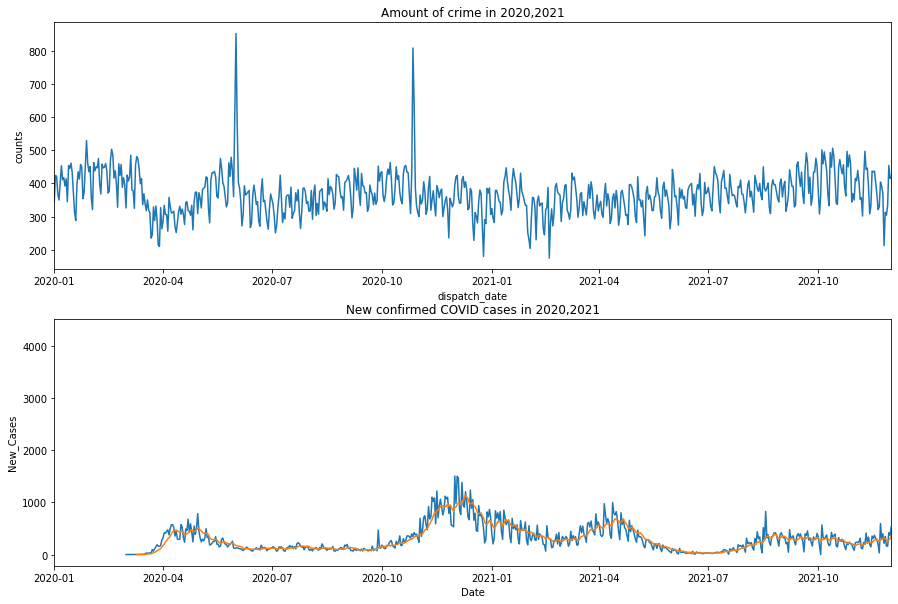

In [0]:
df_date_pd = df_date.to_pandas()
df_date_pd['dispatch_date'] = pd.to_datetime(df_date_pd['dispatch_date'])
df_new_confirmed_pd['Date'] =  pd.to_datetime(df_new_confirmed_pd['Date'])
fig, ax =plt.subplots(2, figsize=(15,10))

sb.lineplot(x=df_date_pd["dispatch_date"],y=df_date_pd["counts"], ax=ax[0])
sb.lineplot(data = df_new_confirmed_pd, x="Date",y="New_Cases", ax=ax[1])
sb.lineplot(data = df_new_confirmed_pd, x="Date",y="moving_average", ax=ax[1])
ax[0].set_xlim(datetime.date(2020,1,1),datetime.date(2021,12,1))
ax[0].set_title("Amount of crime in 2020,2021")
ax[1].set_xlim(datetime.date(2020,1,1),datetime.date(2021,12,1))
ax[1].set_title("New confirmed COVID cases in 2020,2021")
plt.show()

#Analysis 
We can see that there are two peaks in the new confirmed cased COVID line plot, on April/2020, December/2020 respectively. The peak in 2020-04 is the first exploration of COVID19, after a short period of time, the new case is steady and the the number of crime case just increases a little bit. The first peak in the plot of count of crime is on June/2020, is due to the social events, like parade and violent events. 
 The second peak in the plot of count of crime is on Nov/2020. The long lockdown may be the reason. It caused the economy recession and loss of jobs during COVID19 period, which make people become poor and tend to rob and steal for survive. Also, it indicated that after Nov 2020, more and more people ignore the COVID 19 and expose outside for social events, which explain the crime rate increase in winter and the following second peak of COVID19 in the winter of 2020-2021. But we can ignore the cold weather factor that  contribute to the spread of the virus in winter.

In [0]:
# from mpl_toolkits.basemap import Basemap
# import matplotlib.pyplot as plt

# df1 = df.loc[(df['year']==2019) & (df['month']==2) & (df['lat']>38) & (df['lng']>-76)][['lat','lng']].dropna(axis = 0)

# m = Basemap(projection='mill',llcrnrlat=df1.lat.min(),urcrnrlat=df1.lat.max(),
#             llcrnrlon=df1.lng.min()-0.2,urcrnrlon=df1.lng.max()+0.2,resolution="c",epsg=2770)
# x,y= m(tuple(df1.lng.to_numpy()),tuple(df1.lat.to_numpy()))

# plt.figure(figsize=(15,15))
# m.arcgisimage(service="NatGeo_World_Map",xpixels=1500,verbose=True)
# m.plot(x,y,'ro',markersize=2,alpha=0.03)

In [0]:
# Time series analysis
# This part is not based on Spark, and only based on Pandas Time Series package.
# process:
# 1.visualize time series
# 2.plot ACF and find optimal parameter
# 3.Train ARIMA
# 4.Prediction



In [0]:
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.arima_process import arma_generate_sample, ArmaProcess

df_time_series  = df.groupby('dispatch_date').size().reset_index().to_pandas()
df_time_series.columns = ['dispatch_date', 'count']
df_time_series['dispatch_date'] = pd.to_datetime(df_time_series['dispatch_date'])
df_time_series = df_time_series.sort_values(by="dispatch_date")
df_time_series = df_time_series.set_index('dispatch_date')
df_time_series.head()


,count
dispatch_date,
2016-01-01,307
2016-01-02,391
2016-01-03,308
2016-01-04,371
2016-01-05,393


Out[9]: Text(0.5, 1.0, 'Number of crimes for different categories')<Figure size 1800x1080 with 0 Axes>

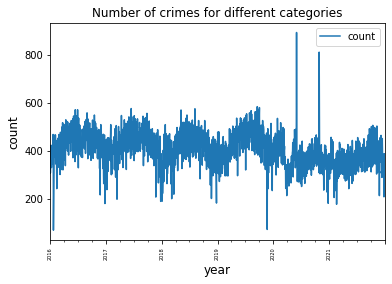

In [0]:
# df_time_series.plot(figsize=(15, 6))
# (kind = 'bar',x = 'dispatch_date',y = 'count',logy = True, color = 'pink', legend = False, align = 'center')
# plt.xlabel("Year")
# plt.legend(['Count of crimes'])


plt.figure(figsize=(25, 15))
#fig,ax = plt.figure(figsize=(20, 10))
#plt.rcParams['xtick.bottom'] = plt.rcParams['xtick.labelbottom'] = True
#plt.rcParams['xtick.top'] = plt.rcParams['xtick.labeltop'] = False
ax = df_time_series.plot()
ax.set_ylabel('count',fontsize = 12)
ax.set_xlabel('year',fontsize = 12)
plt.xticks(fontsize=5, rotation=90)
plt.title('Number of crimes for different categories')

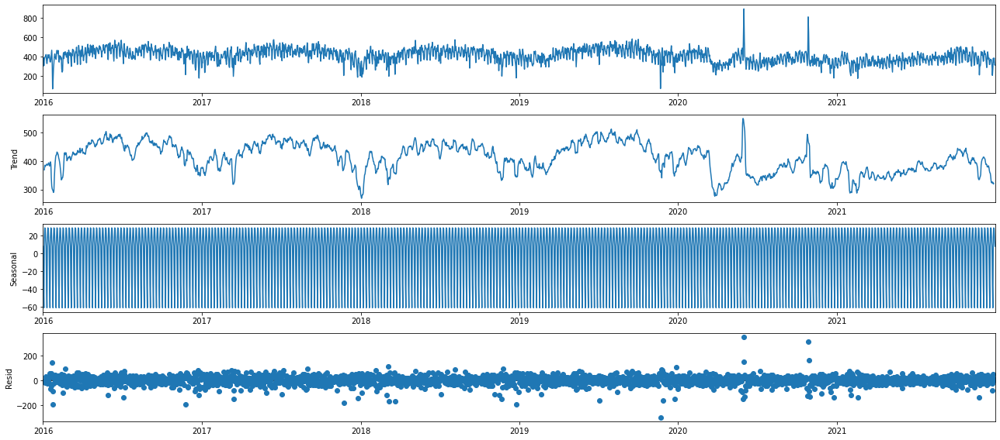

In [0]:
from pylab import rcParams
import statsmodels.api as sm
rcParams['figure.figsize'] = 18, 8
#df_time_series['dispatch_date'] = df_time_series['dispatch_date'].apply(lambda x: x.strftime('%Y-%m-%d'))
decomposition = sm.tsa.seasonal_decompose(df_time_series, model='additive')
fig = decomposition.plot()
plt.show()

In [0]:
df_time_series.index

Out[11]: DatetimeIndex(['2016-01-01', '2016-01-02', '2016-01-03', '2016-01-04',
               '2016-01-05', '2016-01-06', '2016-01-07', '2016-01-08',
               '2016-01-09', '2016-01-10',
               ...
               '2021-12-22', '2021-12-23', '2021-12-24', '2021-12-25',
               '2021-12-26', '2021-12-27', '2021-12-28', '2021-12-29',
               '2021-12-30', '2021-12-31'],
              dtype='datetime64[ns]', name='dispatch_date', length=2192, freq=None)

In [0]:
import itertools
p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]
print('Examples of parameter combinations for Seasonal ARIMA...')
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[1]))
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[2]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[3]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[4]))

Examples of parameter combinations for Seasonal ARIMA...
SARIMAX: (0, 0, 1) x (0, 0, 1, 12)
SARIMAX: (0, 0, 1) x (0, 1, 0, 12)
SARIMAX: (0, 1, 0) x (0, 1, 1, 12)
SARIMAX: (0, 1, 0) x (1, 0, 0, 12)


In [0]:
best_aic = float('inf')

for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(df_time_series,
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False, fit_kw=dict(method='css'))
            results = mod.fit()
            if results.aic < best_aic:
                param1 = param
                param_seasonal1 = param_seasonal
                best_aic = results.aic
        except:
            continue
        
print('ARIMA{}x{}12 - AIC:{}'.format(param1, param_seasonal1, best_aic))

/databricks/python/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
/databricks/python/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
/databricks/python/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
/databricks/python/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
/databricks/python/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:524: ValueWarning: No f

In [0]:
mod = sm.tsa.statespace.SARIMAX(df_time_series,
                                order=(1, 1, 1),
                                seasonal_order=(1, 1, 1, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results = mod.fit()
print(results.summary())

/databricks/python/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
/databricks/python/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
                                     SARIMAX Results                                      
Dep. Variable:                              count   No. Observations:                 2192
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 12)   Log Likelihood              -11678.811
Date:                            Fri, 18 Mar 2022   AIC                          23367.623
Time:                                    02:27:21   BIC                          23396.024
Sample:                                01-01-2016   HQIC                         23378.009
      

In [0]:
results.aic

Out[27]: 23367.622994086574

/databricks/python/lib/python3.8/site-packages/statsmodels/graphics/gofplots.py:993: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


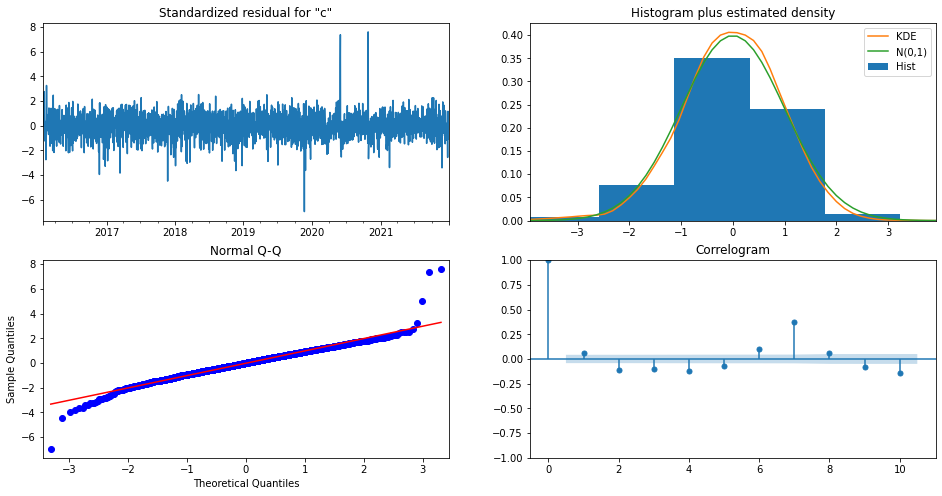

In [0]:
results.plot_diagnostics(figsize=(16, 8))
plt.show()

figure 1 shows there is no seasonal change in the residual over time.
figure 2 shows the residual is a standard normal distribution.
figure 4 shows low correlation between residuals and the lags.

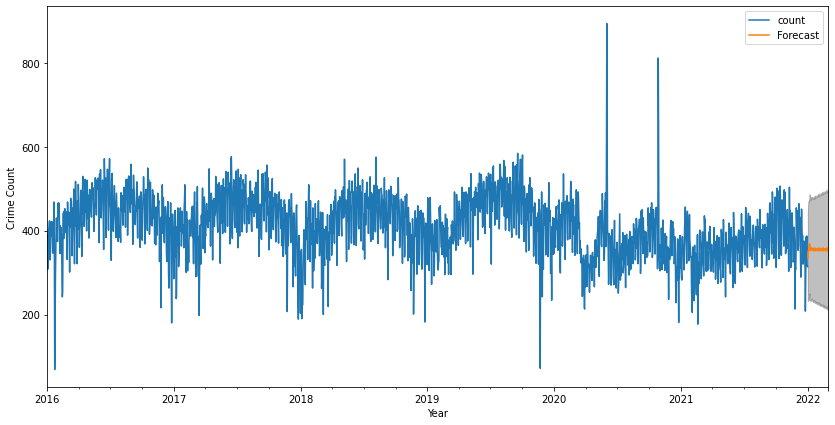

In [0]:
# Predict the number of crimes per day in 60 days
pred_uc = results.get_forecast(steps=60)
pred_ci = pred_uc.conf_int()
ax = df_time_series.plot(label='observed', figsize=(14, 7))
pred_uc.predicted_mean.plot(ax=ax, label='Forecast')
ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.25)
ax.set_xlabel('Year')
ax.set_ylabel('Crime Count')
plt.legend()
plt.show()


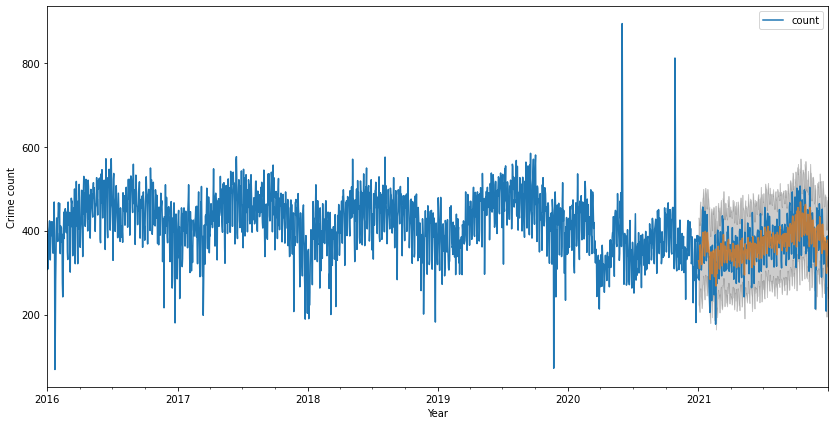

In [0]:
pred= results.get_prediction(start=pd.to_datetime('2021-01-01'), dynamic=False)
pred_ci = pred.conf_int()
ax = df_time_series['2016':].plot(label='observed')
pred.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=.7, figsize=(14, 7))
ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.2)
ax.set_xlabel('Year')
ax.set_ylabel('Crime count')
plt.show()

In [0]:
y_forecasted = pred.predicted_mean.to_numpy()
y_truth = df_time_series['2021-01-01':].to_numpy()
mse = ((y_forecasted - y_truth) ** 2).mean()
print('The Mean Squared Error of our forecasts is {}'.format(round(mse, 2)))

The Mean Squared Error of our forecasts is 4199.33


In [0]:
# Create a Map instance

m = folium.Map(location=[39.95, 75.16], tiles = 'cartodbpositron', zoom_start=11, control_scale=True)
# Get x and y coordinates for each point

# Create a list of coordinate pairs
df2 = df.loc[(df['year']==2019) & (df['month']==1)][['lng','lat']].dropna(axis = 0)
locations = list(zip(df2["lat"].to_numpy(), df2["lng"].to_numpy()))

# Create a folium marker cluster
marker_cluster = MarkerCluster(locations)

# Add marker cluster to map
marker_cluster.add_to(m)

# Show map
m

Make this Notebook Trusted to load map: File -> Trust Notebook <iframe src="about:blank" style="position:absolute;width:100%;height:100%;left:0;top:0;border:none !important;" data-html=%3C%21DOCTYPE%20html%3E%0A%3Chead%3E%20%20%20%20%0A%20%20%20%20%3Cmeta%20http-equiv%3D%22content-type%22%20content%3D%22text/html%3B%20charset%3DUTF-8%22%20/%3E%0A%20%20%20%20%0A%20%20%20%20%20%20%20%20%3Cscript%3E%0A%20%20%20%20%20%20%20%20%20%20%20%20L_NO_TOUCH%20%3D%20false%3B%0A%20%20%20%20%20%20%20%20%20%20%20%20L_DISABLE_3D%20%3D%20false%3B%0A%20%20%20%20%20%20%20%20%3C/script%3E%0A%20%20%20%20%0A%20%20%20%20%3Cstyle%3Ehtml%2C%20body%20%7Bwidth%3A%20100%25%3Bheight%3A%20100%25%3Bmargin%3A%200%3Bpadding%3A%200%3B%7D%3C/style%3E%0A%20%20%20%20%3Cstyle%3E%23map%20%7Bposition%3Aabsolute%3Btop%3A0%3Bbottom%3A0%3Bright%3A0%3Bleft%3A0%3B%7D%3C/style%3E%0A%20%20%20%20%3Cscript%20src%3D%22https%3A//cdn.jsdelivr.net/npm/leaflet%401.6.0/dist/leaflet.js%22%3E%3C/script%3E%0A%20%20%20%20%3Cscript%20src%3D%22https%3A//code.jquery.com/jquery-1.12.4.min.js%22%3E%3C/script%3E%0A%20%20%20%20%3Cscript%20src%3D%22https%3A//maxcdn.bootstrapcdn.com/bootstrap/3.2.0/js/bootstrap.min.js%22%3E%3C/script%3E%0A%20%20%20%20%3Cscript%20src%3D%22https%3A//cdnjs.cloudflare.com/ajax/libs/Leaflet.awesome-markers/2.0.2/leaflet.awesome-markers.js%22%3E%3C/script%3E%0A%20%20%20%20%3Clink%20rel%3D%22stylesheet%22%20href%3D%22https%3A//cdn.jsdelivr.net/npm/leaflet%401.6.0/dist/leaflet.css%22/%3E%0A%20%20%20%20%3Clink%20rel%3D%22stylesheet%22%20href%3D%22https%3A//maxcdn.bootstrapcdn.com/bootstrap/3.2.0/css/bootstrap.min.css%22/%3E%0A%20%20%20%20%3Clink%20rel%3D%22stylesheet%22%20href%3D%22https%3A//maxcdn.bootstrapcdn.com/bootstrap/3.2.0/css/bootstrap-theme.min.css%22/%3E%0A%20%20%20%20%3Clink%20rel%3D%22stylesheet%22%20href%3D%22https%3A//maxcdn.bootstrapcdn.com/font-awesome/4.6.3/css/font-awesome.min.css%22/%3E%0A%20%20%20%20%3Clink%20rel%3D%22stylesheet%22%20href%3D%22https%3A//cdnjs.cloudflare.com/ajax/libs/Leaflet.awesome-markers/2.0.2/leaflet.awesome-markers.css%22/%3E%0A%20%20%20%20%3Clink%20rel%3D%22stylesheet%22%20href%3D%22https%3A//cdn.jsdelivr.net/gh/python-visualization/folium/folium/templates/leaflet.awesome.rotate.min.css%22/%3E%0A%20%20%20%20%0A%20%20%20%20%20%20%20%20%20%20%20%20%3Cmeta%20name%3D%22viewport%22%20content%3D%22width%3Ddevice-width%2C%0A%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20initial-scale%3D1.0%2C%20maximum-scale%3D1.0%2C%20user-scalable%3Dno%22%20/%3E%0A%20%20%20%20%20%20%20%20%20%20%20%20%3Cstyle%3E%0A%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%23map_c53d8b3ce1ff4529bc676cc6f5511666%20%7B%0A%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20position%3A%20relative%3B%0A%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20width%3A%20100.0%25%3B%0A%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20height%3A%20100.0%25%3B%0A%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20left%3A%200.0%25%3B%0A%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20top%3A%200.0%25%3B%0A%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%7D%0A%20%20%20%20%20%20%20%20%20%20%20%20%3C/style%3E%0A%20%20%20%20%20%20%20%20%0A%20%20%20%20%3Cscript%20src%3D%22https%3A//cdnjs.cloudflare.com/ajax/libs/leaflet.markercluster/1.1.0/leaflet.markercluster.js%22%3E%3C/script%3E%0A%20%20%20%20%3Clink%20rel%3D%22stylesheet%22%20href%3D%22https%3A//cdnjs.cloudflare.com/ajax/libs/leaflet.markercluster/1.1.0/MarkerCluster.css%22/%3E%0A%20%20%20%20%3Clink%20rel%3D%22stylesheet%22%20href%3D%22https%3A//cdnjs.cloudflare.com/ajax/libs/leaflet.markercluster/1.1.0/MarkerCluster.Default.css%22/%3E%0A%3C/head%3E%0A%3Cbody%3E%20%20%20%20%0A%20%20%20%20%0A%20%20%20%20%20%20%20%20%20%20%20%20%3Cdiv%20class%3D%22folium-map%22%20id%3D%22map_c53d8b3ce1ff4529bc676cc6f5511666%22%20%3E%3C/div%3E%0A%20%20%20%20%20%20%20%20%0A%3C/body%3E%0A%3Cscript%3E%20%20%20%20%0A%20%20%20%20%0A%20%20%20%20%20%20%20%20%20%20%20%20var%20map_c53d8b3ce1ff4529bc676cc6f55116